# Requirement package list

```python
open3d==0.17.0
scikit-learn==1.2.2
scipy==1.10.1
torch==1.8.1+cu101
torch-cluster==1.6.1
torch-geometric==2.3.0
torch-scatter==2.1.1
torch-sparse==0.6.17
torch-spline-conv==1.2.2
torchaudio==0.8.1
torchvision==0.9.1+cu101
```

```python
!pip install open3d
!pip install sklearn
!conda install pytorch

```
본 노트북은 Kaggle의 `Balraj Ashwath`의 주피터 노트북을 바탕으로 공부한 것을 정리하였습니다. 
[참고 링크](https://www.kaggle.com/code/balraj98/pointnet-for-3d-object-classification-pytorch)

## [reference](https://www.kaggle.com/code/balraj98/pointnet-for-3d-object-classification-pytorch)

In [1]:
import os
import open3d as o3d
import glob
import numpy as np
import math,random
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader,SubsetRandomSampler
from torchvision import transforms, utils
import torch.nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import scipy.spatial.distance
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from tqdm.auto import tqdm, trange
import seaborn as sns

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
path = "./Dataset/ModelNet10/"

In [3]:
data_path= glob.glob(path+'/*')
data_path

['./datasets/ModelNet10/chair',
 './datasets/ModelNet10/toilet',
 './datasets/ModelNet10/desk',
 './datasets/ModelNet10/monitor',
 './datasets/ModelNet10/sofa',
 './datasets/ModelNet10/night_stand',
 './datasets/ModelNet10/table',
 './datasets/ModelNet10/dresser',
 './datasets/ModelNet10/bathtub',
 './datasets/ModelNet10/bed']

In [4]:
#class가 존재할 경우에만 list를 저장 
folders = [di for di in sorted(os.listdir(path)) if os.path.isdir(path+di)]
classes = {folder: i for i ,folder in enumerate(folders)}
inv_classes = {i: cat for cat, i in classes.items()};
classes,inv_classes

({'bathtub': 0,
  'bed': 1,
  'chair': 2,
  'desk': 3,
  'dresser': 4,
  'monitor': 5,
  'night_stand': 6,
  'sofa': 7,
  'table': 8,
  'toilet': 9},
 {0: 'bathtub',
  1: 'bed',
  2: 'chair',
  3: 'desk',
  4: 'dresser',
  5: 'monitor',
  6: 'night_stand',
  7: 'sofa',
  8: 'table',
  9: 'toilet'})

read_off라는 함수를 짜서 txt 파일을 read하는 방식이 있고,   
off확장자를 읽는 open3d package를 사용하는 방식이 있다

## read_off를 사용할 경우 
```python
def read_off(file):
    """
    head is off 
    second row represent point num and information
    """
    if 'OFF' != file.readline().strip(): # off file head is off  
        raise('Not a valid OFF header')  # if file is not off, raise 
    # read sample num 
    n_verts, n_faces, __ = tuple([int(s) for s in file.readline().strip().split(' ')])
    
    # read 
    verts = [[float(s) for s in file.readline().strip().split(' ')] for i_vert in range(n_verts)]
    faces = [[int(s) for s in file.readline().strip().split(' ')][1:] for i_face in range(n_faces)]
    return verts, faces

# open file 
with open(path+"sofa/train/sofa_0002.off", 'r') as f:
    verts, faces = read_off(f)
    
i,j,k = np.array(faces).T
x,y,z = np.array(verts).T

```

In [5]:
# o3d를 사용할 경우
def read_off(path):
    """
    triangle_mesh: general mesh type
    include 3 vertex, 3 edge -> triangle 
    triangle mesh is genally simple and fast 
    """
    data = o3d.io.read_triangle_mesh(path)
    verts      = np.array(data.vertices,dtype = np.float32)
    triangles  = np.array(data.triangles,dtype = np.int32)
    return verts,triangles

In [6]:
verts, faces = read_off(path+"sofa/train/sofa_0002.off")

In [7]:
len(verts),len(faces)

(6433, 11354)

In [8]:
x,y,z = verts.T
i,j,k = faces.T

# 시각화를 위해서 plotly를 사용해보자

In [9]:
def visualize_rotate(data): # data는 plotly graph_object를 매개변수로 넣어야함 
    x_eye, y_eye, z_eye = 1.25, 1.25, 0.8
    frames=[]

    def rotate_z(x, y, z, theta): # 어느 방향으로 rotate할 것인가? 
        w = x+1j*y
        return np.real(np.exp(1j*theta)*w), np.imag(np.exp(1j*theta)*w), z

    for t in np.arange(0, 10.26, 0.1):
        xe, ye, ze = rotate_z(x_eye, y_eye, z_eye, -t)
        frames.append(dict(layout=dict(scene=dict(camera=dict(eye=dict(x=xe, y=ye, z=ze))))))
    fig = go.Figure(data=data,
        layout=go.Layout(
            updatemenus=[dict(type='buttons',
                showactive=False,
                y=1,
                x=0.8,
                xanchor='left',
                yanchor='bottom',
                pad=dict(t=45, r=10),
                buttons=[dict(label='Play',
                    method='animate',
                    args=[None, dict(frame=dict(duration=50, redraw=True),
                        transition=dict(duration=0),
                        fromcurrent=True,
                        mode='immediate'
                        )]
                    )
                ])]
        ),
        frames=frames
    )
    return fig
def pcshow(point_cloud):
    x,y,z= point_cloud.T
    data=[go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers')]
    fig = visualize_rotate(data)
    fig.update_traces(marker=dict(size=2,
                      line=dict(width=2,
                      color='DarkSlateGrey')),
                      selector=dict(mode='markers'))
    fig.update_layout(title_text = "show")
    fig.show()
from plotly.subplots import make_subplots

def pcshow_2(point_set,plot_num,title=None):
    if title==None:
        title = [str(i) for i in range(plot_num)]
    plot_type = {'type': 'surface'}
    fig = make_subplots(rows=1, cols=plot_num,column_titles=title, specs=[[{'type': 'surface'}for i in range(plot_num)]])
    for i in range(plot_num):
        x,y,z = point_set[i].T
        
        fig.add_trace(go.Scatter3d(x=x, y=y, z=z,
                                       mode='markers',
                                   marker=dict(size=2,
                          line=dict(width=2,
                          color='DarkSlateGrey'))
                                   ,name=title[i]),row=1,col=i+1)
    fig.show()
    # return fig
    

In [10]:
visualize_rotate([go.Mesh3d(x=x,y=y,z=z,i=i,j=j,k=k,opacity= 0.3,color="orange")])
#mesh data로 보았을 때의 모습 ,sofa처럼 생긴 것을 볼 수 있음 

In [11]:
visualize_rotate([go.Scatter3d(x=x, y=y, z=z, mode='markers',marker=
                              dict(size=1,
                                   line=dict(width=3,
                      color='DarkSlateGrey')
                                  ))]).show()


In [12]:
faces

array([[   0,    1,    2],
       [   0,    3,    1],
       [   2,    4,    5],
       ...,
       [6398, 6337, 6400],
       [6245, 6400, 6337],
       [6400, 6245, 6403]], dtype=int32)

In [13]:
pcshow_2([verts,faces],2,title=['verts','faces'])

In [14]:
verts[0]

array([32.98545, -8.56285, 39.55135], dtype=float32)

# off data에 대한 이해 
> off data는 verts, faces로 이루어 져 있는데 각각을 확인해보면 다음과 같다 
```python
faces[0]
> array([0, 1, 2], dtype=int32)

verts[0]
> array([32.98545, -8.56285, 39.55135], dtype=float32)

verts[faces[0]]
>array([[32.98545, -8.56285, 39.55135],
       [29.8576 , 13.25175, 10.96485],
       [32.0856 , 10.60875, 29.60695]], dtype=float32)
```
즉, verts는 mesh데이터의 꼭지점의 좌표를 의미하고, 
faces는 연관성(저장 타임에 따라 다름) 이 있는 데이터들의 모음이다(triangles에서는 삼각형이 된다).

위에서 `verts[faces[0]`는 3개의 verts를 가지고 삼각형을 만들 수 있다

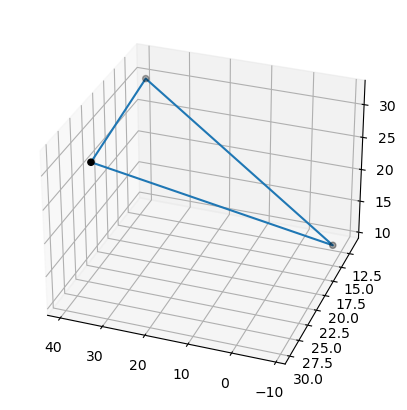

In [15]:
fig, axs = plt.subplots(figsize=(10, 5), subplot_kw={"projection":"3d"})
axs.view_init(elev=30, azim=110)
x,y,z = verts[faces[0]]
axs.scatter(x,y,z,s=20,c="black")
axs.plot(np.hstack((x,x[0])),np.hstack((y,y[0])),np.hstack((z,z[0])))
plt.show()

# Sampler
> Sampler에서 해야하는 중요한 2 목적
1) NN에 넣기 위해서 input size를 고정시킬 필요가 있다.
>+ 차원의 문제를 해결하기 위함
>+ MLP의 차원을 매번 변경하는 것은 번거로우므로
>+ 논문에서는 robust를 확인하기 위해서 sample을 조절하면서 실험을 하였다. 

2) off에 따로 저장된 verts와 faces를 하나의 mesh data로 생성해주는것 
> + 위에서 본 것 처럼 verts의 data만 가지고는 point cloud data로 만들 수가 없다. point cloud로 바꾸기 위해서 
>verts ,triangles를 사용하여 mesh data로 바꾸어야 한다

Sampler를 사용하기 위해서 sample code의 class를 하나씩 살펴보자


In [16]:
class PointSampler:
    """
        isinstance(100,int) => true
        isinstance("100",int) => False , AssertionError
    """
    def __init__(self, output_size):
        assert isinstance(output_size, int)
        self.output_size = output_size
    
    def triangle_area(self, pt1, pt2, pt3): # 헤론의 공식을 사용하여 triangle 넓이를 구함 
        side_a = np.linalg.norm(pt1 - pt2)
        side_b = np.linalg.norm(pt2 - pt3)
        side_c = np.linalg.norm(pt3 - pt1)
        # 각각의 norm을 구한다음 
        # 삼각형의 넓이를 구함 
        s = ( side_a + side_b + side_c)/2
        return max(s * (s - side_a) * (s - side_b) * (s - side_c), 0)**0.5 # 넓이는 무조건 0보다 커야함

    def sample_point(self, pt1, pt2, pt3):
        """
        barycentric coordinates는 삼각형의 내부 점을 표현하는 좌표 시스템으로, 
        삼각형 내부의 임의의 점을 세 꼭지점으로 부터의 거리 비율로 나타낸다. 
        즉, 임의의 점에 대해서 비율 계산을 통해 해당 점의 위치를 정확하게 나타낸다. 
    
        Sampling된 faces를 바탕으로 삼각형의 성질(barycentric coordinates)을 이용해서 
        verts가 삼각형의 어느 위치에 존재하는지를 계산한다 
        verts, faces -> point cloud로 바꾸는 과정 
        Random을 사용하는 이유는 삼각형의 내부에서 고르게 분포하는 point set을 생성하기 위함임
        즉, random sampling이 여기서도 적용됨
        """
               
        # barycentric coordinates on a triangle
        # https://mathworld.wolfram.com/BarycentricCoordinates.html
        
        
        s, t = sorted([random.random(), random.random()])
        f = lambda i: s * pt1[i] + (t-s)*pt2[i] + (1-t)*pt3[i]
        return (f(0), f(1), f(2))
        
    
    def __call__(self, mesh):
        verts, faces = mesh
        verts = np.array(verts)
        areas = np.zeros((len(faces)))

        for i in range(len(areas)):
            areas[i] = (self.triangle_area(verts[faces[i][0]],
                                           verts[faces[i][1]],
                                           verts[faces[i][2]]))
        # random choices parameters: lsit , weight(probability), k: point num 
        #계산한 areas를 바탕으로 weight를 설정하는데, 이는 mesh의 넓이가 클 수록 
        #sampling을 자주 하게 됨 -> mesh가 클 수록 의미 있는 의미 있는 data라는 의미를 가짐 
        
        sampled_faces = (random.choices(faces, 
                                      weights=areas,
                                      cum_weights=None,
                                      k=self.output_size))
        # 최종적으로 사용할 sampling list 
        sampled_points = np.zeros((self.output_size, 3))
        #결국 sample point라는 것은 
        for i in range(len(sampled_faces)):
            sampled_points[i] = (self.sample_point(verts[sampled_faces[i][0]],
                                                   verts[sampled_faces[i][1]],
                                                   verts[sampled_faces[i][2]]))
        
        return np.array(sampled_points)

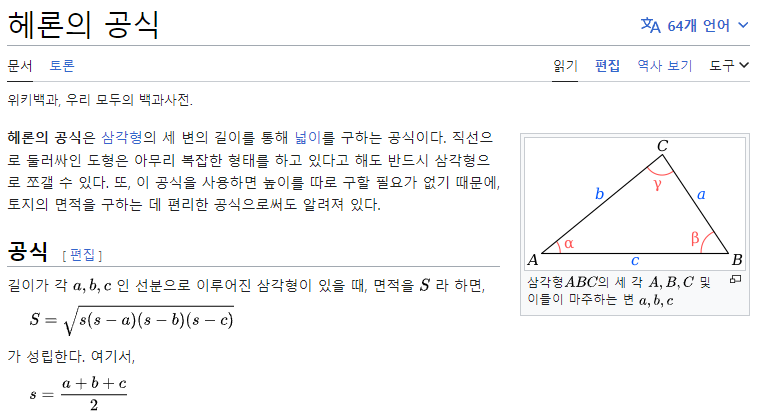

In [17]:
def triangle_area(pt1, pt2, pt3): # 헤론의 공식을 사용하여 triangle 넓이를 구함 
    side_a = np.linalg.norm(pt1 - pt2)
    side_b = np.linalg.norm(pt2 - pt3)
    side_c = np.linalg.norm(pt3 - pt1)
    # 각각의 norm을 구한다음 
    # 삼각형의 넓이를 구함 
    s = ( side_a + side_b + side_c)/2
    return max(s * (s - side_a) * (s - side_b) * (s - side_c), 0)**0.5 # 넓이는 무조건 0보다 커야함

In [18]:
verts, faces = read_off(path+"sofa/train/sofa_0002.off")
# verts = np.array(verts) #if you rad 
areas = np.zeros((len(faces)))
output_size = 1000 # sampling rate 

In [19]:
#각각의 areas를 구한다음 ,저장한다.
for i in range(len(areas)):
    areas[i] = (triangle_area(verts[faces[i][0]],
                                   verts[faces[i][1]],
                                   verts[faces[i][2]]))

x : [11211    67    28     0    12     4     0     6     2     8     2     0
     0     0     0     0     0     3     1     0     2     0     0     0
     0     0     0     4     0     4]
y : [   0.          155.86419549  311.72839097  467.59258646  623.45678195
  779.32097743  935.18517292 1091.0493684  1246.91356389 1402.77775938
 1558.64195486 1714.50615035 1870.37034584 2026.23454132 2182.09873681
 2337.96293229 2493.82712778 2649.69132327 2805.55551875 2961.41971424
 3117.28390973 3273.14810521 3429.0123007  3584.87649619 3740.74069167
 3896.60488716 4052.46908264 4208.33327813 4364.19747362 4520.0616691
 4675.92586459]


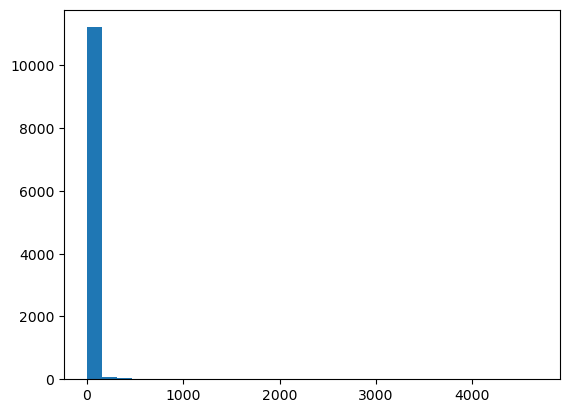

In [20]:
"""
histogram을 보면, 0에 해당하는 area가 많은데, 이런 data는 학습하는데 별 도움이 되지 않을 것임   
그래서 random choice를 할 때 weights를 그나마 넓이가 큰 것을 기준으로 sampling을 진행하고 싶은 것 
"""
plt.hist(areas,bins=30)
# plt.xlim(0,1000)
x,y = np.histogram(areas,bins=30)
print("x :", x)
print("y :",y)
plt.show()

In [21]:
"""random하게 k개의 samling을 진행한다. 
계산한 areas를 바탕으로 weight를 설정하는데, 이는 mesh의 넓이가 클 수록 
sampling을 자주 하게 됨 -> mesh가 클 수록 의미 있는 의미 있는 data라는 의미를 가짐 
"""
sampled_faces = (random.choices(faces, 
                          weights=areas,
                          cum_weights=None,
                          k=output_size))

sampled_points = np.zeros((output_size, 3))
sampled_points.shape

(1000, 3)

$t_1 + t_2 + t_3 = 1$  
$(t_1,t_2,t_3) = (\mu t_1 ,\mu t_2, \mu t_3)$

In [22]:
def sample_point(pt1, pt2, pt3):
    """
    barycentric coordinates는 삼각형의 내부 점을 표현하는 좌표 시스템으로, 
    삼각형 내부의 임의의 점을 세 꼭지점으로 부터의 거리 비율로 나타낸다. 
    즉, 임의의 점에 대해서 비율 계산을 통해 해당 점의 위치를 정확하게 나타낸다. 

    Sampling된 faces를 바탕으로 삼각형의 성질(barycentric coordinates)을 이용해서 
    verts가 삼각형의 어느 위치에 존재하는지를 계산한다 
    verts, faces -> point cloud로 바꾸는 과정 
    Random을 사용하는 이유는 삼각형의 내부에서 고르게 분포하는 point set을 생성하기 위함임
    즉, random sampling이 여기서도 적용됨
    """
    # barycentric coordinates on a triangle
    # https://mathworld.wolfram.com/BarycentricCoordinates.html
    s, t = sorted([random.random(), random.random()])
    #random하게 s,t를 구한 다음 
    f = lambda i: s * pt1[i] + (t-s)*pt2[i] + (1-t)*pt3[i]
    #좌표를 계산한다. 
    return (f(0), f(1), f(2))
for i in range(len(sampled_faces)):
    sampled_points[i] = (sample_point(verts[sampled_faces[i][0]],
                                           verts[sampled_faces[i][1]],
                                           verts[sampled_faces[i][2]]))


In [23]:
# sampled faces를 사용하여 mesh를 생성해 내었다. 
pcshow_2(np.array([sampled_faces,sampled_points]),2,title=['sampled_faces','sampled_points'])

In [24]:
# sampling 결과 확인
pointcloud = PointSampler(6000)((verts, faces))
# pcshow(*pointcloud.T) #*는 list를 풀어준다 
fig = pcshow_2([verts,faces,pointcloud],3,title=['verts',"faces",'sampling point cloud'])
# fig.write_image("./img.png")

#### 드디어 verts와 faces를 사용하여 point cloud data를 생성하게 되었다. plot을 찍어보아도 진짜 sofa처럼 보인다. 
> 이제 위의 point cloud data를 바탕으로 Dataset을 만들어 보자 

$\mu = E[X] = \int_{-\infty}^{\infty}xf(x)dx$  
$\sigma = \sqrt{E[X-\mu]} \\= \sqrt{\int_{\infty}^{\infty}}(x-\mu)^2f(x)dx \\= \sqrt{E[x]^2 -(E[x])^2)}$  
$||x||_p = \sqrt{\sum_{i=1}^n(x_i)^p}$


# transform 정의
Torchvision에 있는 transform은 2D 이미지에 대해서 적용되기 때문에 3d에서 작용하기 위해선 
3d에 맞는 transform을 적용해줘야 한다

In [25]:
class Normalize():
    def __call__(self, pointcloud): 
        assert len(pointcloud.shape)==2 # (point_num, 3)이 아니면 assert 
        
        norm_pointcloud = pointcloud - np.mean(pointcloud, axis=0) # point를 기준으로(axis=0) normalize진행
        norm_pointcloud /= np.max(np.linalg.norm(norm_pointcloud, axis=1)) #norm을 구한뒤 나눈 값을 std로 사용하여 
        #normalize를 진행함

        return  norm_pointcloud
    
class RandRotation_z():
    """
    https://en.wikipedia.org/wiki/Rotation_matrix    
    z에 대해서 rotation을 하는 matrix
    """
    def __call__(self, pointcloud):

        assert len(pointcloud.shape)==2

        theta = random.random() * 2. * math.pi
        rot_matrix = np.array([[ math.cos(theta), -math.sin(theta),    0],
                               [ math.sin(theta),  math.cos(theta),    0],
                               [0,                             0,      1]])
        
        rot_pointcloud = rot_matrix.dot(pointcloud.T).T
        return  rot_pointcloud

class RandomNoise():
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        noise = np.random.normal(0, 0.02, (pointcloud.shape)) # normal distribution을 생성후 
        noisy_pointcloud = pointcloud + noise
        return  noisy_pointcloud
class ToTensor():
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2
        return torch.tensor(pointcloud,dtype = torch.float32)
        # return torch.from_numpy(pointcloud)

# 값의 범위가 normalize된 것을 확인할 수 있다

In [26]:
norm_pointcloud = Normalize()(pointcloud)
fig = pcshow_2([pointcloud,norm_pointcloud],2,title=['pointcloud','norm_pointcloud'])

In [27]:
rot_pointcloud = RandRotation_z()(norm_pointcloud)
noisy_rot_pointcloud = RandomNoise()(rot_pointcloud)
fig = pcshow_2([norm_pointcloud,rot_pointcloud,noisy_rot_pointcloud],3,title=['norm_pointcloud',"rot_pointcloud",'noisy_rot_pointcloud'])
# fig.write_image("./img.png")

In [28]:
def default_transforms():
    return transforms.Compose([
                                PointSampler(1024),
                                Normalize(),
                                ToTensor()
                              ])

In [29]:
train_transform = transforms.Compose([PointSampler(1024),
                                    Normalize(),
                                    RandRotation_z(),
                                    RandomNoise(),
                                      # transforms.ToTensor() #transform의 totensor는 image로 취급해서 3d반환함
                                      ToTensor()
                                     ])
valid_transform = transforms.Compose([PointSampler(1024),
                                    Normalize(),
                                    # RandRotation_z(),
                                    # RandomNoise(),
                                      # transforms.ToTensor() #transform의 totensor는 image로 취급해서 3d반환함
                                      ToTensor()
                                     ])
train_transform((verts,faces)).shape,valid_transform((verts,faces))

(torch.Size([1024, 3]),
 tensor([[-0.3206,  0.4413, -0.2863],
         [-0.4140, -0.6286, -0.2818],
         [ 0.3081, -0.5164, -0.1776],
         ...,
         [-0.1760,  0.3595, -0.0976],
         [-0.1967,  0.5379,  0.2649],
         [-0.2589, -0.1944,  0.0581]]))

In [30]:
# To show the total dataset num
point = []
label = []
for category in classes.keys():
    new_dir = path+category+"/train"
    for file in glob.glob(new_dir+'/*'):
        if file.endswith(".off"): 
            point.append(file)
            label.append(category)
print("Total train sample num: ",len(point))

Total train sample num:  3991


# split valid dataset

In [31]:
class PointCloudData(Dataset):
    def __init__(self,root_dir,
                folder = "/train",
                 transform = default_transforms()):
        self.root_dir = root_dir
        folders = [di for di in sorted(os.listdir(path)) if os.path.isdir(path+di)]
        self.transforms = transform
        self.classes = {folder: i for i ,folder in enumerate(folders)}
        self.point = []
        self.label = []
        for category in self.classes.keys():
            new_dir = self.root_dir+category+folder
            for file in glob.glob(new_dir+'/*'):
                if file.endswith(".off"): # off로 끝난다면
                    self.point.append(file)
                    self.label.append(category)
    def __len__(self):
        return len(self.point)
    def __preprocessing__(self,file):
        verts,faces = read_off(file)
        pointcloud = self.transforms((verts,faces))
        return pointcloud.T # In torch, channel is the first 
    def __getitem__(self,idx):
        point = self.point[idx]
        label = self.label[idx]
        pointcloud = self.__preprocessing__(point)
        return {"pointcloud":pointcloud,
               "category":self.classes[label]} 

In [32]:
train_dataset = PointCloudData(path,folder='/train',transform =train_transform )
valid_dataset = PointCloudData(path,folder='/train',transform =valid_transform )
test_dataset  = PointCloudData(path,folder='/test',transform = valid_transform)

In [33]:
valid_size = 0.2

print('Train dataset size: ', int(train_dataset.__len__()*(1-valid_size)))
print('Valid dataset size: ', int(train_dataset.__len__()*(valid_size)))
print('Test dataset size: ', test_dataset.__len__())
print('Number of classes: ', len(train_dataset.classes))
print('Sample pointcloud shape: ', train_dataset[0]['pointcloud'].size())
print('Class: ', inv_classes[train_dataset[0]['category']])

Train dataset size:  3192
Valid dataset size:  798
Test dataset size:  908
Number of classes:  10
Sample pointcloud shape:  torch.Size([3, 1024])
Class:  bathtub


In [34]:
num_train = int(len(point))
indices = np.arange(num_train)
np.random.shuffle(indices)
split= int(np.floor(valid_size*num_train))
train_idx , valid_idx = indices[split:],indices[:split]
# Sampler means when Dataloader read batch, only read each index
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

#############
train_loader = DataLoader(dataset=train_dataset,batch_size = 64,
                         sampler = train_sampler)
valid_loader = DataLoader(dataset=valid_dataset,batch_size=64,
                         sampler = valid_sampler)
test_loader  = DataLoader(dataset=test_dataset , batch_size = 64,
                         shuffle=False)

In [35]:
test_loader.batch_size

64

In [36]:
# data = next(iter(train_loader))

# model Implementation
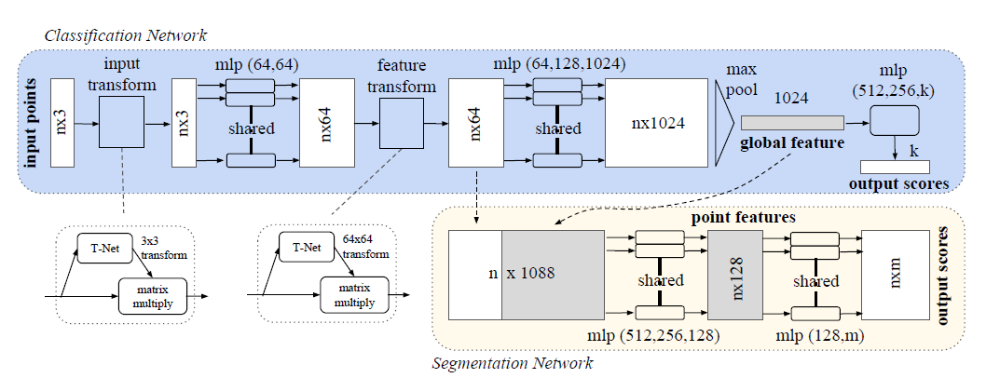

model은 간단한 mlp, maxpool로 이루어져 있다. 
# Tnet의 구조는 다음과 같다
<img src=attachment:0d69ec9a-8419-4d7d-b0fd-d49539f6ab4a.png width="1000" height="500">

[그림참조](https://ganghee-lee.tistory.com/50)

In [37]:
def mlp_block(in_dim, out_dim,act_f = True):
    layers = [nn.Conv1d(in_dim, out_dim, kernel_size=1,stride=1),
        nn.BatchNorm1d(out_dim),
             ]
    if act_f:
        layers+=[nn.ReLU()]
    return nn.Sequential(*layers)

def fc_block(in_dim, out_dim,dropout_rate = None):
    layers = [nn.Linear(in_dim, out_dim,bias=False),]
    if dropout_rate is not None:
        layers+= [nn.Dropout(p=dropout_rate)]
        
    layers += [nn.BatchNorm1d(out_dim),
               nn.ReLU()]
    return nn.Sequential(*layers)


class Tnet(nn.Module):
    def __init__(self,k=3):
        super().__init__()
        """
        k: point feature (x,y,z + alpha)
        Note that 1x1 conv is same fully connected layer
        output must be k x k matrix because Tnet learned transform matrix
        """
        self.k = k
        self.mlp = nn.Sequential(mlp_block(k,64),
                                mlp_block(64,128),
                                mlp_block(128,1024))
        self.fc = nn.Sequential(fc_block(1024,512),
                               fc_block(512,256))
        self.liner = nn.Linear(256,k*k)

        self.pool = nn.MaxPool1d(1024)
        
        
    def forward(self,x):
        # input.shape = (batch, n, k)
        x = self.mlp(x)
        x = nn.Flatten(1)(self.pool(x))
        x = self.fc(x)
        #원래의 정보를 더해줌으로서 변형이 심하지 않게 보존 
        identity = torch.eye(self.k, requires_grad=True).repeat(x.size(0),1,1) 
        if x.is_cuda:
            identity = identity.to(device)
        matrix = self.liner(x).view(-1,self.k,self.k) + identity
        return matrix
class Transform(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_transform = Tnet(k=3)
        self.feature_transform = Tnet(k=64)
        self.mlp1 = nn.Sequential(mlp_block(3,64))
        self.mlp2 = nn.Sequential(mlp_block(64,128))
        self.mlp3 = nn.Sequential(mlp_block(128,1024,act_f=False))

    def forward(self, x):
        matrix3x3 = self.input_transform(x)
        # batch matrix multiplication
        x = torch.bmm(x.transpose(1,2),matrix3x3).transpose(1,2)
        x = self.mlp1(x)
        matrix64x64 = self.feature_transform(x)
        x = torch.bmm(x.transpose(1,2), matrix64x64).transpose(1,2)
        x = self.mlp2(x)
        x = self.mlp3(x)
        x = nn.MaxPool1d(x.size(-1))(x)
        output = nn.Flatten(1)(x)
        return output, matrix3x3, matrix64x64
    
class PointNet(nn.Module):
    def __init__(self, classes = 10):
        super().__init__()
        self.transform = Transform()
        self.fc1 = fc_block(1024,512,dropout_rate = None)
        self.fc2 = fc_block(512,256,dropout_rate=0.3)
        self.fc3 = nn.Linear(256, classes)

        # self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, x):
        x, matrix3x3, matrix64x64 = self.transform(x)
        x = self.fc1(x)
        x = self.fc2(x)
        output = self.fc3(x)
        return output, matrix3x3, matrix64x64

$L_{reg} = ||I-AA^T||_F^2$ : Norm을 regularization으로 사용

In [38]:
class PointNetLoss(nn.Module):
    def __init__(self,criterion = nn.CrossEntropyLoss()):
        super().__init__()
        self.criterion = criterion
        
    def L2_reg(self,m3x3,m64x64,weight_decay):
        bs      = m3x3.size(0)
        id3x3   = torch.eye(3, requires_grad=True).repeat(bs,1,1)
        id64x64 = torch.eye(64, requires_grad=True).repeat(bs,1,1)
        if m3x3.is_cuda:
            id3x3   = id3x3.to(device)
            id64x64 = id64x64.to(device)
        # regularization I - AA.T
        diff3x3   = id3x3-torch.bmm(m3x3,m3x3.transpose(1,2)) 
        diff64x64 = id64x64-torch.bmm(m64x64,m64x64.transpose(1,2))   
        
        return weight_decay * (torch.norm(diff3x3)+torch.norm(diff64x64)) / float(bs)
    def forward(self,logits, labels, m3x3,m64x64,weight_decay = 1e-4):
        return self.criterion(logits,labels)+self.L2_reg(m3x3,m64x64,weight_decay)

In [39]:
def train(model,optimizer,loss_fc,
          train_loader, val_loader=None,scheduler=None,n_epochs=10,
          path="./model",save_path ="/model.pth"):
    # assert
    valid_min = np.inf
    TRAIN_LOSS = []
    VALID_LOSS = []
    TRAIN_ACC= []
    VALID_ACC = []

    if not os.path.exists(path):
        os.makedirs(path)
    for epoch in tqdm(range(n_epochs)): 
        model.train()
        tloss = []
        tacc  = []
        bar = tqdm(train_loader)
        for i, data in enumerate(bar, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].to(device)
            optimizer.zero_grad()
            logits, m3x3, m64x64 = model(inputs)

            loss = loss_fc(logits, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()

            # print statistics
            tloss.append(loss.item())
            prob = nn.Softmax(dim=1)(logits)
            _, predicted = torch.max(prob, 1)
            
            tacc.append((predicted == labels).float().mean().item())
            
            # if i % 5 == 4:    # print every 10 mini-batches
            #     print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f' %
            #         (epoch + 1, i + 1, len(train_loader), running_loss / 10))
            #     running_loss = 0.0
            bar.set_description('Train Loss: {:.5f} Train Acc : {:.6f}'.format(
                np.mean(tloss),np.mean(tacc)))

        TRAIN_LOSS.append(np.mean(tloss))
        TRAIN_ACC.append(np.mean(tacc))
        model.eval()
        
        # validation
        if val_loader:
            vloss = []
            vacc  = []
            bar= tqdm(val_loader)
            with torch.no_grad():
                for data in bar:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].to(device)
                    logits, m3x3, m64x64 = model(inputs)
                    prob = nn.Softmax(dim=1)(logits)
                    # _,predict = torch.max(prob,dim=1)
                    # total += labels.size(0)
                    # correct += (predict == labels).sum().item()
                    loss = loss_fc(logits, labels, m3x3, m64x64)
                    vloss.append(loss.item())
                    
                    prob = nn.Softmax(dim=1)(logits)
                    _, predicted = torch.max(prob, 1)
                    
                    vacc.append((predicted == labels).float().mean().item())
                    bar.set_description('Valid Loss: {:.5f} Valid Acc : {:.6f}'.format(
                        np.mean(vloss),np.mean(vacc)))
            # val_acc = 100. * correct / total
            # print('Valid accuracy: %d %%' % val_acc)
        VALID_LOSS.append(np.mean(vloss))
        VALID_ACC.append(np.mean(vacc))
        if scheduler is not None:
            scheduler.step()
        # save the model
        if valid_min >= VALID_LOSS[-1]:
            valid_min = VALID_LOSS[-1]
            print("Loss is decreased")
            torch.save(model.state_dict(),path+save_path)
    return TRAIN_LOSS,VALID_LOSS,TRAIN_ACC,VALID_ACC

In [40]:
# Set device
os.environ["CUDA_VISIBLE_DEVICES"] ='1' # set gpu numver 
device = torch.device("cuda:1" if torch.cuda.is_available() else 'cpu')
print(device)

cuda:1


In [41]:
import torch.optim as optim
model = PointNet()
model.to(device)
# model = nn.DataParallel(model)
learning_rate = 1e-3
n_epochs =  10
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer,
#                                                  T_max=n_epochs, # First Length of Cicle
#                                                  # T_mult= 1,        # cicle length control param
#                                                  eta_min= 1e-6,    # minimun_lr
#                                                          )
scheduler = None
loss_fc = PointNetLoss()
# Load a pre-trained model if it exists
# pointnet.load_state_dict(torch.load('../model/save.pth'))scheduler

In [42]:
# data = next(iter(train_loader))
# logits ,m3x3, m64x64 = model(data['pointcloud'].to(device))

# loss_fc(logits,data['category'].to(device),m3x3,m64x64)

In [44]:
TRAIN_LOSS,VALID_LOSS,TRAIN_ACC,VALID_ACC = train(model,
      optimizer,
      loss_fc,
      train_loader = train_loader,
      val_loader=valid_loader,
      scheduler=None,
      n_epochs=n_epochs,
      path="./model",
      save_path ="/save.pth")

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Loss is decreased


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Loss is decreased


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Loss is decreased


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

Loss is decreased


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

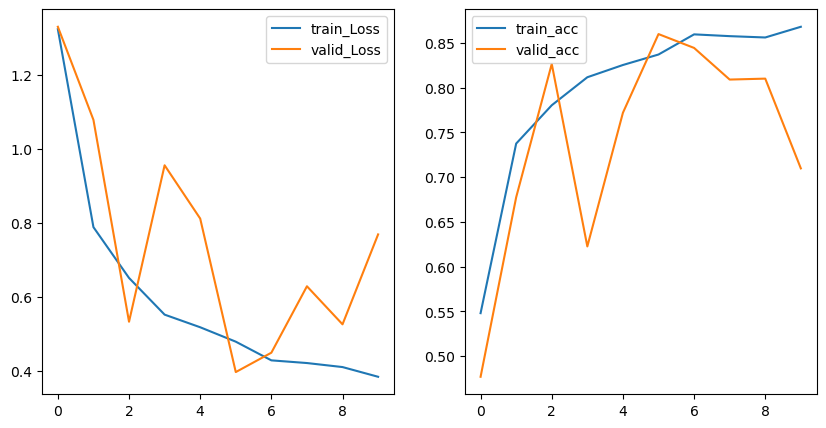

In [46]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(range(n_epochs),TRAIN_LOSS,label='train_Loss')
plt.plot(range(n_epochs),VALID_LOSS,label='valid_Loss')
plt.legend()
plt.subplot(122)
plt.plot(range(n_epochs),TRAIN_ACC,label='train_acc')
plt.plot(range(n_epochs),VALID_ACC,label='valid_acc')
plt.legend()
plt.show()

In [47]:
def test(model,test_loader,load_path):
    model.load_state_dict(torch.load(load_path))
    model.eval()
    PREDICT= []
    TARGET = []
    with torch.no_grad():
        for i, data in tqdm(enumerate(test_loader),total=test_loader.__len__()):
            # print('Batch [%4d / %4d]' % (i+1, len(test_loader)))
            inputs, labels = data['pointcloud'].float().to(device), data['category']
            outputs, __, __ = model(inputs)
            prob = nn.Softmax(dim=1)(outputs)
            _, preds = torch.max(outputs.data, 1)

            PREDICT.append(preds.detach().cpu().numpy())
            TARGET.append(labels.numpy())
    PREDICT= np.concatenate(PREDICT)
    TARGET = np.concatenate(TARGET)
    return PREDICT, TARGET
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in zip(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [51]:
PREDICT, TARGET = test(model,test_loader,"./model/model.pth")

  0%|          | 0/15 [00:00<?, ?it/s]

In [46]:
cm = confusion_matrix(TARGET, PREDICT)
cm = (cm/cm.sum(axis=1).reshape(-1,1)).round(2)
print("test: ", (PREDICT==TARGET).mean().round(2))

test:  0.85


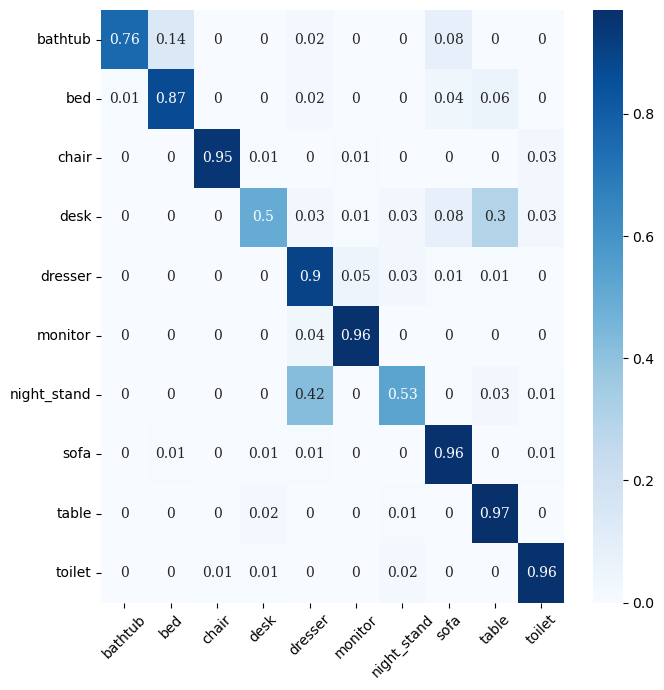

In [47]:
fig = plt.figure(figsize=(7,7))
ax = sns.heatmap(cm,annot=True,cmap="Blues",
                  annot_kws={
                # 'fontsize': 9,
                # 'fontweight': 'bold',
                'fontfamily': 'serif'})

ax.set_yticklabels(list(classes.keys()), rotation=0
                   # ,fontsize =7
                  )
ax.set_xticklabels(list(classes.keys()), rotation=45
                   # ,fontsize =7
                  )
plt.tight_layout()
plt.show()

In [52]:
# plt.figure(figsize=(8,8))
# plot_confusion_matrix(cm, list(classes.keys()), normalize=True)